In [ ]:
import sys
import tensorflow as tf
sys.path.append("/visuworks/Blindless_AIFFELTON/Ablation Study/")

# import customized modules
import preprocess, data_generator, check_result, metrics, loss, train

sys.path.append("/visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet")
import dense_unet

# Insert Path
# {model_name}_{epoch}ep_{model_inpusize}_{Generator | aG/fG/sG}
FILE_NAME = 'dense_unet_30ep_512_fG'
INPUT_SHAPE = (512, 512, 1)
MODEL_PATH = "/visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/" + FILE_NAME + ".tf"
HISTORY_PATH = "/visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/history/" + FILE_NAME + '_history' ".json"

TRAIN_SOURCE = '/visuworks/Dataset/Selected Dataset 3/Train'
TEST_SOURCE = '/visuworks/Dataset/Selected Dataset 3/Test'

2024-01-30 08:24:31.389284: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-30 08:24:31.389310: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-30 08:24:31.390216: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-30 08:24:31.395236: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-30 08:24:31.962320: W tensorflow/compiler/tf2

In [4]:
# Define custom objects for loading the model
custom_objects = {'DiceLoss': loss.DiceLoss(), 
                  'sensitivity': metrics.sensitivity,
                  'specificity': metrics.specificity,
                  'accuracy' : metrics.accuracy}


# Create augmentation
train_preproc = preprocess.build_augmentation_for_general()
test_preproc = preprocess.build_augmentation_for_general(is_train=False)

# Create train, test generator
train_generator = data_generator.FullSizedDataGenerator(
    TRAIN_SOURCE,
    batch_size= 4,
    img_size=INPUT_SHAPE,
    output_size=INPUT_SHAPE,
    is_train=True,
    augmentation= train_preproc
)

test_generator = data_generator.FullSizedDataGenerator(
    TRAIN_SOURCE,
    batch_size= 4,
    img_size=INPUT_SHAPE,
    output_size=INPUT_SHAPE,
    is_train=False,
    augmentation= test_preproc
)

# Create model
model = dense_unet.build_model(input_shape=INPUT_SHAPE)
model.summary()

2024-01-30 08:28:21.091636: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-01-30 08:28:21.125381: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-01-30 08:28:21.125596: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 512, 512, 1)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 512, 512, 48)         480       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 512, 512, 48)         192       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 512, 512, 48)         0         ['batch_normalization[0][0

In [4]:
train.model_train(model,
                 30,
                 train_generator,
                 test_generator, 
                 MODEL_PATH,
                 HISTORY_PATH,
                 save_every_epoch = True,
                 apply_weight_decay = True)


Epoch 00001: WeightDecayScheduler setting learning rate to 9.999899747381279e-05.
Epoch 1/30


2024-01-30 07:24:20.546722: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904
2024-01-30 07:24:23.181986: W external/local_tsl/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 736.00MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-01-30 07:24:23.182023: W external/local_tsl/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 736.00MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-01-30 07:24:23.182037: W external/local_tsl/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 736.00MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there co

221/221 [==============================] - ETA: 0s - loss: 0.4257 - sensitivity: 0.5710 - specificity: 0.9503 - accuracy: 0.9240INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/1--0.4257-0.5710-0.9503-0.0347-0.9990.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/1--0.4257-0.5710-0.9503-0.0347-0.9990.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/1--0.4257-0.5710-0.9503-0.0347-0.9990.pb
221/221 [==============================] - 133s 524ms/step - loss: 0.4257 - sensitivity: 0.5710 - specificity: 0.9503 - accuracy: 0.9240 - val_loss: 0.7642 - val_sensitivity: 0.0347 - val_specificity: 0.9990 - val_accuracy: 0.9314

Epoch 00002: WeightDecayScheduler setting learning rate to 9.99980006775877e-05.
Epoch 2/30
221/221 [==============================] - ETA: 0s - loss: 0.3258 - sensitivity: 0.6409 - specificity: 0.9730 - accuracy: 0.9499INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/2--0.3258-0.6409-0.9730-0.4652-0.9869.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/2--0.3258-0.6409-0.9730-0.4652-0.9869.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/2--0.3258-0.6409-0.9730-0.4652-0.9869.pb
221/221 [==============================] - 110s 499ms/step - loss: 0.3258 - sensitivity: 0.6409 - specificity: 0.9730 - accuracy: 0.9499 - val_loss: 0.4114 - val_sensitivity: 0.4652 - val_specificity: 0.9869 - val_accuracy: 0.9505

Epoch 00003: WeightDecayScheduler setting learning rate to 9.999700388136262e-05.
Epoch 3/30
221/221 [==============================] - ETA: 0s - loss: 0.3052 - sensitivity: 0.6689 - specificity: 0.9740 - accuracy: 0.9528INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/3--0.3052-0.6689-0.9740-0.6480-0.9801.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/3--0.3052-0.6689-0.9740-0.6480-0.9801.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/3--0.3052-0.6689-0.9740-0.6480-0.9801.pb
221/221 [==============================] - 110s 495ms/step - loss: 0.3052 - sensitivity: 0.6689 - specificity: 0.9740 - accuracy: 0.9528 - val_loss: 0.2907 - val_sensitivity: 0.6480 - val_specificity: 0.9801 - val_accuracy: 0.9569

Epoch 00004: WeightDecayScheduler setting learning rate to 9.999600708513754e-05.
Epoch 4/30
221/221 [==============================] - ETA: 0s - loss: 0.2943 - sensitivity: 0.6800 - specificity: 0.9751 - accuracy: 0.9546INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/4--0.2943-0.6800-0.9751-0.7631-0.9604.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/4--0.2943-0.6800-0.9751-0.7631-0.9604.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/4--0.2943-0.6800-0.9751-0.7631-0.9604.pb
221/221 [==============================] - 110s 497ms/step - loss: 0.2943 - sensitivity: 0.6800 - specificity: 0.9751 - accuracy: 0.9546 - val_loss: 0.2987 - val_sensitivity: 0.7631 - val_specificity: 0.9604 - val_accuracy: 0.9466

Epoch 00005: WeightDecayScheduler setting learning rate to 9.999501028891246e-05.
Epoch 5/30
221/221 [==============================] - ETA: 0s - loss: 0.2863 - sensitivity: 0.6881 - specificity: 0.9757 - accuracy: 0.9557INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/5--0.2863-0.6881-0.9757-0.6869-0.9794.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/5--0.2863-0.6881-0.9757-0.6869-0.9794.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/5--0.2863-0.6881-0.9757-0.6869-0.9794.pb
221/221 [==============================] - 115s 519ms/step - loss: 0.2863 - sensitivity: 0.6881 - specificity: 0.9757 - accuracy: 0.9557 - val_loss: 0.2704 - val_sensitivity: 0.6869 - val_specificity: 0.9794 - val_accuracy: 0.9590

Epoch 00006: WeightDecayScheduler setting learning rate to 9.999401349268737e-05.
Epoch 6/30
221/221 [==============================] - ETA: 0s - loss: 0.2809 - sensitivity: 0.6917 - specificity: 0.9763 - accuracy: 0.9565INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/6--0.2809-0.6917-0.9763-0.7328-0.9734.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/6--0.2809-0.6917-0.9763-0.7328-0.9734.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/6--0.2809-0.6917-0.9763-0.7328-0.9734.pb
221/221 [==============================] - 109s 493ms/step - loss: 0.2809 - sensitivity: 0.6917 - specificity: 0.9763 - accuracy: 0.9565 - val_loss: 0.2688 - val_sensitivity: 0.7328 - val_specificity: 0.9734 - val_accuracy: 0.9566

Epoch 00007: WeightDecayScheduler setting learning rate to 9.999301669646229e-05.
Epoch 7/30
221/221 [==============================] - ETA: 0s - loss: 0.2771 - sensitivity: 0.6936 - specificity: 0.9768 - accuracy: 0.9571INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/7--0.2771-0.6936-0.9768-0.7075-0.9789.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/7--0.2771-0.6936-0.9768-0.7075-0.9789.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/7--0.2771-0.6936-0.9768-0.7075-0.9789.pb
221/221 [==============================] - 114s 516ms/step - loss: 0.2771 - sensitivity: 0.6936 - specificity: 0.9768 - accuracy: 0.9571 - val_loss: 0.2607 - val_sensitivity: 0.7075 - val_specificity: 0.9789 - val_accuracy: 0.9599

Epoch 00008: WeightDecayScheduler setting learning rate to 9.999201990023722e-05.
Epoch 8/30
221/221 [==============================] - ETA: 0s - loss: 0.2729 - sensitivity: 0.6962 - specificity: 0.9774 - accuracy: 0.9578INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/8--0.2729-0.6962-0.9774-0.7466-0.9725.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/8--0.2729-0.6962-0.9774-0.7466-0.9725.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/8--0.2729-0.6962-0.9774-0.7466-0.9725.pb
221/221 [==============================] - 113s 510ms/step - loss: 0.2729 - sensitivity: 0.6962 - specificity: 0.9774 - accuracy: 0.9578 - val_loss: 0.2643 - val_sensitivity: 0.7466 - val_specificity: 0.9725 - val_accuracy: 0.9567

Epoch 00009: WeightDecayScheduler setting learning rate to 9.999102310401214e-05.
Epoch 9/30
221/221 [==============================] - ETA: 0s - loss: 0.2693 - sensitivity: 0.6985 - specificity: 0.9779 - accuracy: 0.9584INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/9--0.2693-0.6985-0.9779-0.7209-0.9778.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/9--0.2693-0.6985-0.9779-0.7209-0.9778.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/9--0.2693-0.6985-0.9779-0.7209-0.9778.pb
221/221 [==============================] - 113s 511ms/step - loss: 0.2693 - sensitivity: 0.6985 - specificity: 0.9779 - accuracy: 0.9584 - val_loss: 0.2570 - val_sensitivity: 0.7209 - val_specificity: 0.9778 - val_accuracy: 0.9599

Epoch 00010: WeightDecayScheduler setting learning rate to 9.999002630778705e-05.
Epoch 10/30
221/221 [==============================] - ETA: 0s - loss: 0.2670 - sensitivity: 0.6975 - specificity: 0.9783 - accuracy: 0.9588INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/10--0.2670-0.6975-0.9783-0.7196-0.9782.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/10--0.2670-0.6975-0.9783-0.7196-0.9782.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/10--0.2670-0.6975-0.9783-0.7196-0.9782.pb
221/221 [==============================] - 111s 501ms/step - loss: 0.2670 - sensitivity: 0.6975 - specificity: 0.9783 - accuracy: 0.9588 - val_loss: 0.2558 - val_sensitivity: 0.7196 - val_specificity: 0.9782 - val_accuracy: 0.9601

Epoch 00011: WeightDecayScheduler setting learning rate to 9.998902951156197e-05.
Epoch 11/30
221/221 [==============================] - ETA: 0s - loss: 0.2648 - sensitivity: 0.6985 - specificity: 0.9786 - accuracy: 0.9591INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/11--0.2648-0.6985-0.9786-0.6813-0.9833.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/11--0.2648-0.6985-0.9786-0.6813-0.9833.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/11--0.2648-0.6985-0.9786-0.6813-0.9833.pb
221/221 [==============================] - 115s 519ms/step - loss: 0.2648 - sensitivity: 0.6985 - specificity: 0.9786 - accuracy: 0.9591 - val_loss: 0.2540 - val_sensitivity: 0.6813 - val_specificity: 0.9833 - val_accuracy: 0.9623

Epoch 00012: WeightDecayScheduler setting learning rate to 9.998803271533689e-05.
Epoch 12/30
221/221 [==============================] - ETA: 0s - loss: 0.2622 - sensitivity: 0.6985 - specificity: 0.9791 - accuracy: 0.9595INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/12--0.2622-0.6985-0.9791-0.7041-0.9817.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/12--0.2622-0.6985-0.9791-0.7041-0.9817.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/12--0.2622-0.6985-0.9791-0.7041-0.9817.pb
221/221 [==============================] - 110s 495ms/step - loss: 0.2622 - sensitivity: 0.6985 - specificity: 0.9791 - accuracy: 0.9595 - val_loss: 0.2483 - val_sensitivity: 0.7041 - val_specificity: 0.9817 - val_accuracy: 0.9623

Epoch 00013: WeightDecayScheduler setting learning rate to 9.99870359191118e-05.
Epoch 13/30
221/221 [==============================] - ETA: 0s - loss: 0.2599 - sensitivity: 0.6973 - specificity: 0.9798 - accuracy: 0.9601INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/13--0.2599-0.6973-0.9798-0.6421-0.9862.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/13--0.2599-0.6973-0.9798-0.6421-0.9862.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/13--0.2599-0.6973-0.9798-0.6421-0.9862.pb
221/221 [==============================] - 116s 526ms/step - loss: 0.2599 - sensitivity: 0.6973 - specificity: 0.9798 - accuracy: 0.9601 - val_loss: 0.2626 - val_sensitivity: 0.6421 - val_specificity: 0.9862 - val_accuracy: 0.9622

Epoch 00014: WeightDecayScheduler setting learning rate to 9.998603912288672e-05.
Epoch 14/30
221/221 [==============================] - ETA: 0s - loss: 0.2576 - sensitivity: 0.6989 - specificity: 0.9799 - accuracy: 0.9603INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/14--0.2576-0.6989-0.9799-0.7075-0.9806.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/14--0.2576-0.6989-0.9799-0.7075-0.9806.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/14--0.2576-0.6989-0.9799-0.7075-0.9806.pb
221/221 [==============================] - 113s 513ms/step - loss: 0.2576 - sensitivity: 0.6989 - specificity: 0.9799 - accuracy: 0.9603 - val_loss: 0.2502 - val_sensitivity: 0.7075 - val_specificity: 0.9806 - val_accuracy: 0.9615

Epoch 00015: WeightDecayScheduler setting learning rate to 9.998504232666165e-05.
Epoch 15/30
221/221 [==============================] - ETA: 0s - loss: 0.2555 - sensitivity: 0.6989 - specificity: 0.9803 - accuracy: 0.9607INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/15--0.2555-0.6989-0.9803-0.6784-0.9840.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/15--0.2555-0.6989-0.9803-0.6784-0.9840.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/15--0.2555-0.6989-0.9803-0.6784-0.9840.pb
221/221 [==============================] - 112s 509ms/step - loss: 0.2555 - sensitivity: 0.6989 - specificity: 0.9803 - accuracy: 0.9607 - val_loss: 0.2515 - val_sensitivity: 0.6784 - val_specificity: 0.9840 - val_accuracy: 0.9627

Epoch 00016: WeightDecayScheduler setting learning rate to 9.998404553043657e-05.
Epoch 16/30
221/221 [==============================] - ETA: 0s - loss: 0.2533 - sensitivity: 0.6978 - specificity: 0.9809 - accuracy: 0.9612INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/16--0.2533-0.6978-0.9809-0.7149-0.9814.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/16--0.2533-0.6978-0.9809-0.7149-0.9814.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/16--0.2533-0.6978-0.9809-0.7149-0.9814.pb
221/221 [==============================] - 108s 490ms/step - loss: 0.2533 - sensitivity: 0.6978 - specificity: 0.9809 - accuracy: 0.9612 - val_loss: 0.2422 - val_sensitivity: 0.7149 - val_specificity: 0.9814 - val_accuracy: 0.9628

Epoch 00017: WeightDecayScheduler setting learning rate to 9.998304873421149e-05.
Epoch 17/30
221/221 [==============================] - ETA: 0s - loss: 0.2518 - sensitivity: 0.6976 - specificity: 0.9811 - accuracy: 0.9614INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/17--0.2518-0.6976-0.9811-0.7401-0.9776.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/17--0.2518-0.6976-0.9811-0.7401-0.9776.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/17--0.2518-0.6976-0.9811-0.7401-0.9776.pb
221/221 [==============================] - 112s 507ms/step - loss: 0.2518 - sensitivity: 0.6976 - specificity: 0.9811 - accuracy: 0.9614 - val_loss: 0.2447 - val_sensitivity: 0.7401 - val_specificity: 0.9776 - val_accuracy: 0.9610

Epoch 00018: WeightDecayScheduler setting learning rate to 9.99820519379864e-05.
Epoch 18/30
221/221 [==============================] - ETA: 0s - loss: 0.2496 - sensitivity: 0.6972 - specificity: 0.9817 - accuracy: 0.9618INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/18--0.2496-0.6972-0.9817-0.6840-0.9852.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/18--0.2496-0.6972-0.9817-0.6840-0.9852.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/18--0.2496-0.6972-0.9817-0.6840-0.9852.pb
221/221 [==============================] - 110s 497ms/step - loss: 0.2496 - sensitivity: 0.6972 - specificity: 0.9817 - accuracy: 0.9618 - val_loss: 0.2437 - val_sensitivity: 0.6840 - val_specificity: 0.9852 - val_accuracy: 0.9642

Epoch 00019: WeightDecayScheduler setting learning rate to 9.998105514176132e-05.
Epoch 19/30
221/221 [==============================] - ETA: 0s - loss: 0.2485 - sensitivity: 0.6964 - specificity: 0.9819 - accuracy: 0.9621INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/19--0.2485-0.6964-0.9819-0.6732-0.9853.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/19--0.2485-0.6964-0.9819-0.6732-0.9853.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/19--0.2485-0.6964-0.9819-0.6732-0.9853.pb
221/221 [==============================] - 116s 526ms/step - loss: 0.2485 - sensitivity: 0.6964 - specificity: 0.9819 - accuracy: 0.9621 - val_loss: 0.2476 - val_sensitivity: 0.6732 - val_specificity: 0.9853 - val_accuracy: 0.9634

Epoch 00020: WeightDecayScheduler setting learning rate to 9.998005834553624e-05.
Epoch 20/30
221/221 [==============================] - ETA: 0s - loss: 0.2466 - sensitivity: 0.6956 - specificity: 0.9826 - accuracy: 0.9626INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/20--0.2466-0.6956-0.9826-0.7223-0.9813.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/20--0.2466-0.6956-0.9826-0.7223-0.9813.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/20--0.2466-0.6956-0.9826-0.7223-0.9813.pb
221/221 [==============================] - 110s 497ms/step - loss: 0.2466 - sensitivity: 0.6956 - specificity: 0.9826 - accuracy: 0.9626 - val_loss: 0.2386 - val_sensitivity: 0.7223 - val_specificity: 0.9813 - val_accuracy: 0.9632

Epoch 00021: WeightDecayScheduler setting learning rate to 9.997906154931117e-05.
Epoch 21/30
221/221 [==============================] - ETA: 0s - loss: 0.2442 - sensitivity: 0.6944 - specificity: 0.9832 - accuracy: 0.9631INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/21--0.2442-0.6944-0.9832-0.6545-0.9870.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/21--0.2442-0.6944-0.9832-0.6545-0.9870.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/21--0.2442-0.6944-0.9832-0.6545-0.9870.pb
221/221 [==============================] - 113s 514ms/step - loss: 0.2442 - sensitivity: 0.6944 - specificity: 0.9832 - accuracy: 0.9631 - val_loss: 0.2527 - val_sensitivity: 0.6545 - val_specificity: 0.9870 - val_accuracy: 0.9638

Epoch 00022: WeightDecayScheduler setting learning rate to 9.997806475308608e-05.
Epoch 22/30
221/221 [==============================] - ETA: 0s - loss: 0.2430 - sensitivity: 0.6937 - specificity: 0.9835 - accuracy: 0.9633INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/22--0.2430-0.6937-0.9835-0.6973-0.9841.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/22--0.2430-0.6937-0.9835-0.6973-0.9841.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/22--0.2430-0.6937-0.9835-0.6973-0.9841.pb
221/221 [==============================] - 113s 513ms/step - loss: 0.2430 - sensitivity: 0.6937 - specificity: 0.9835 - accuracy: 0.9633 - val_loss: 0.2418 - val_sensitivity: 0.6973 - val_specificity: 0.9841 - val_accuracy: 0.9640

Epoch 00023: WeightDecayScheduler setting learning rate to 9.9977067956861e-05.
Epoch 23/30
221/221 [==============================] - ETA: 0s - loss: 0.2417 - sensitivity: 0.6946 - specificity: 0.9837 - accuracy: 0.9635INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/23--0.2417-0.6946-0.9837-0.6817-0.9855.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/23--0.2417-0.6946-0.9837-0.6817-0.9855.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/23--0.2417-0.6946-0.9837-0.6817-0.9855.pb
221/221 [==============================] - 111s 499ms/step - loss: 0.2417 - sensitivity: 0.6946 - specificity: 0.9837 - accuracy: 0.9635 - val_loss: 0.2437 - val_sensitivity: 0.6817 - val_specificity: 0.9855 - val_accuracy: 0.9643

Epoch 00024: WeightDecayScheduler setting learning rate to 9.997607116063592e-05.
Epoch 24/30
221/221 [==============================] - ETA: 0s - loss: 0.2387 - sensitivity: 0.6944 - specificity: 0.9842 - accuracy: 0.9641INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/24--0.2387-0.6944-0.9842-0.6678-0.9877.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/24--0.2387-0.6944-0.9842-0.6678-0.9877.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/24--0.2387-0.6944-0.9842-0.6678-0.9877.pb
221/221 [==============================] - 116s 524ms/step - loss: 0.2387 - sensitivity: 0.6944 - specificity: 0.9842 - accuracy: 0.9641 - val_loss: 0.2404 - val_sensitivity: 0.6678 - val_specificity: 0.9877 - val_accuracy: 0.9654

Epoch 00025: WeightDecayScheduler setting learning rate to 9.997507436441083e-05.
Epoch 25/30
221/221 [==============================] - ETA: 0s - loss: 0.2369 - sensitivity: 0.6935 - specificity: 0.9847 - accuracy: 0.9645INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/25--0.2369-0.6935-0.9847-0.6958-0.9850.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/25--0.2369-0.6935-0.9847-0.6958-0.9850.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/25--0.2369-0.6935-0.9847-0.6958-0.9850.pb
221/221 [==============================] - 114s 515ms/step - loss: 0.2369 - sensitivity: 0.6935 - specificity: 0.9847 - accuracy: 0.9645 - val_loss: 0.2364 - val_sensitivity: 0.6958 - val_specificity: 0.9850 - val_accuracy: 0.9648

Epoch 00026: WeightDecayScheduler setting learning rate to 9.997407756818575e-05.
Epoch 26/30
221/221 [==============================] - ETA: 0s - loss: 0.2352 - sensitivity: 0.6923 - specificity: 0.9852 - accuracy: 0.9649INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/26--0.2352-0.6923-0.9852-0.6765-0.9855.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/26--0.2352-0.6923-0.9852-0.6765-0.9855.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/26--0.2352-0.6923-0.9852-0.6765-0.9855.pb
221/221 [==============================] - 111s 503ms/step - loss: 0.2352 - sensitivity: 0.6923 - specificity: 0.9852 - accuracy: 0.9649 - val_loss: 0.2469 - val_sensitivity: 0.6765 - val_specificity: 0.9855 - val_accuracy: 0.9639

Epoch 00027: WeightDecayScheduler setting learning rate to 9.997308077196067e-05.
Epoch 27/30
221/221 [==============================] - ETA: 0s - loss: 0.2354 - sensitivity: 0.6926 - specificity: 0.9851 - accuracy: 0.9647INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/27--0.2354-0.6926-0.9851-0.7009-0.9837.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/27--0.2354-0.6926-0.9851-0.7009-0.9837.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/27--0.2354-0.6926-0.9851-0.7009-0.9837.pb
221/221 [==============================] - 114s 514ms/step - loss: 0.2354 - sensitivity: 0.6926 - specificity: 0.9851 - accuracy: 0.9647 - val_loss: 0.2380 - val_sensitivity: 0.7009 - val_specificity: 0.9837 - val_accuracy: 0.9640

Epoch 00028: WeightDecayScheduler setting learning rate to 9.99720839757356e-05.
Epoch 28/30
221/221 [==============================] - ETA: 0s - loss: 0.2328 - sensitivity: 0.6921 - specificity: 0.9859 - accuracy: 0.9655INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/28--0.2328-0.6921-0.9859-0.6951-0.9852.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/28--0.2328-0.6921-0.9859-0.6951-0.9852.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/28--0.2328-0.6921-0.9859-0.6951-0.9852.pb
221/221 [==============================] - 110s 497ms/step - loss: 0.2328 - sensitivity: 0.6921 - specificity: 0.9859 - accuracy: 0.9655 - val_loss: 0.2351 - val_sensitivity: 0.6951 - val_specificity: 0.9852 - val_accuracy: 0.9649

Epoch 00029: WeightDecayScheduler setting learning rate to 9.997108717951051e-05.
Epoch 29/30
221/221 [==============================] - ETA: 0s - loss: 0.2300 - sensitivity: 0.6944 - specificity: 0.9862 - accuracy: 0.9659INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/29--0.2300-0.6944-0.9862-0.6729-0.9853.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/29--0.2300-0.6944-0.9862-0.6729-0.9853.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/29--0.2300-0.6944-0.9862-0.6729-0.9853.pb
221/221 [==============================] - 115s 518ms/step - loss: 0.2300 - sensitivity: 0.6944 - specificity: 0.9862 - accuracy: 0.9659 - val_loss: 0.2490 - val_sensitivity: 0.6729 - val_specificity: 0.9853 - val_accuracy: 0.9634

Epoch 00030: WeightDecayScheduler setting learning rate to 9.997009038328543e-05.
Epoch 30/30
221/221 [==============================] - ETA: 0s - loss: 0.2314 - sensitivity: 0.6926 - specificity: 0.9859 - accuracy: 0.9655INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/30--0.2314-0.6926-0.9859-0.7284-0.9806.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/30--0.2314-0.6926-0.9859-0.7284-0.9806.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/30--0.2314-0.6926-0.9859-0.7284-0.9806.pb
221/221 [==============================] - 109s 492ms/step - loss: 0.2314 - sensitivity: 0.6926 - specificity: 0.9859 - accuracy: 0.9655 - val_loss: 0.2376 - val_sensitivity: 0.7284 - val_specificity: 0.9806 - val_accuracy: 0.9629


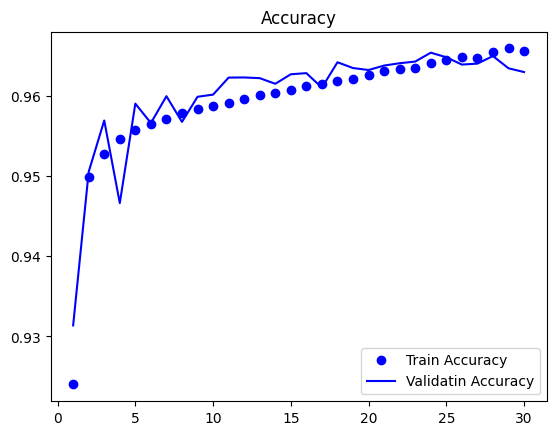

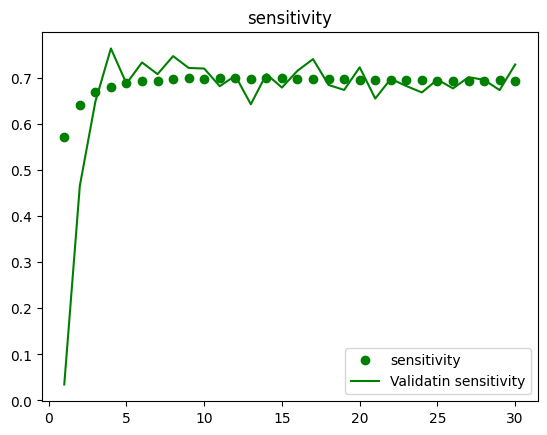

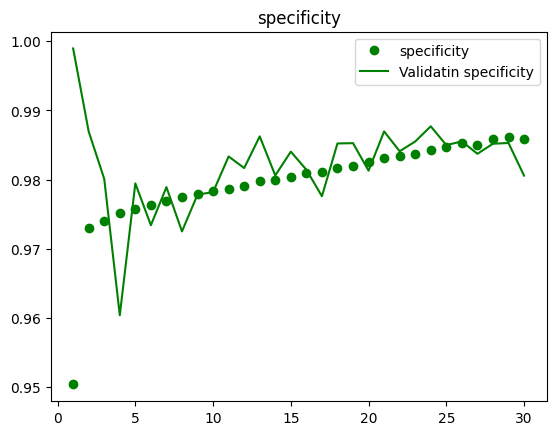

<Figure size 640x480 with 0 Axes>

In [3]:
check_result.plot_history(HISTORY_PATH)

In [8]:
test_generator = data_generator.FullSizedDataGenerator(
    TEST_SOURCE, 
    img_size=INPUT_SHAPE,
    output_size=INPUT_SHAPE,
    is_train=False,
    augmentation= test_preproc
)
# Load the model with custom_objects parameter
MODEL_PATH = '/visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/8--0.2729-0.6962-0.9774-0.7466-0.9725.pb'
model = tf.keras.models.load_model(MODEL_PATH, custom_objects=custom_objects)

metrics.print_evaluation(model, test_generator)

77/77 [==============================] - 18s 228ms/step - loss: 0.2848 - sensitivity: 0.7473 - specificity: 0.9695 - accuracy: 0.9551
Loss: 0.28483954071998596
Sensitivity: 0.7473445534706116
Specificity: 0.969458818435669
Accuracy: 0.9550933837890625


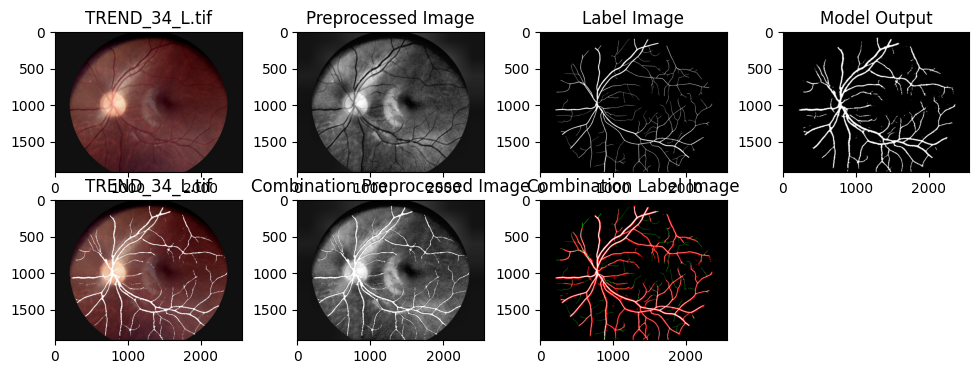

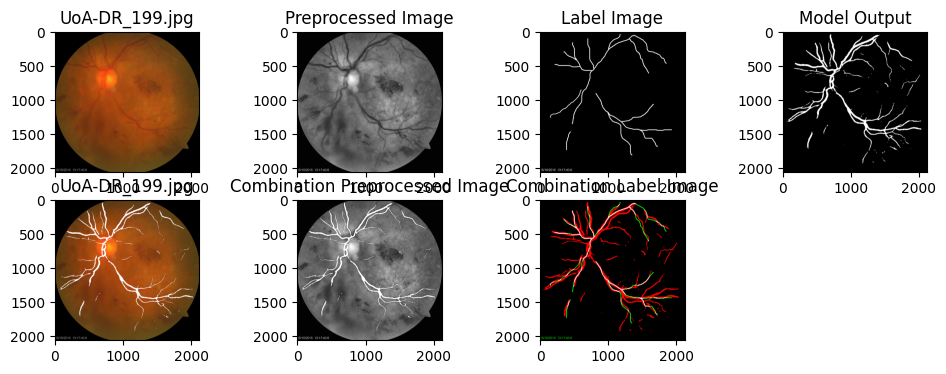

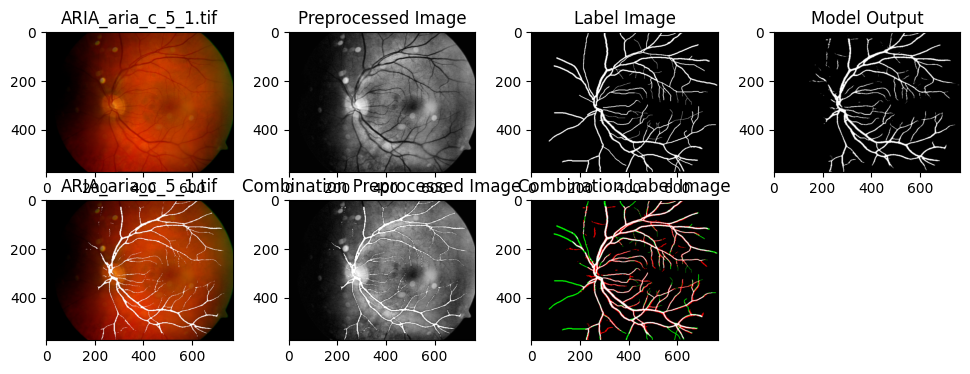

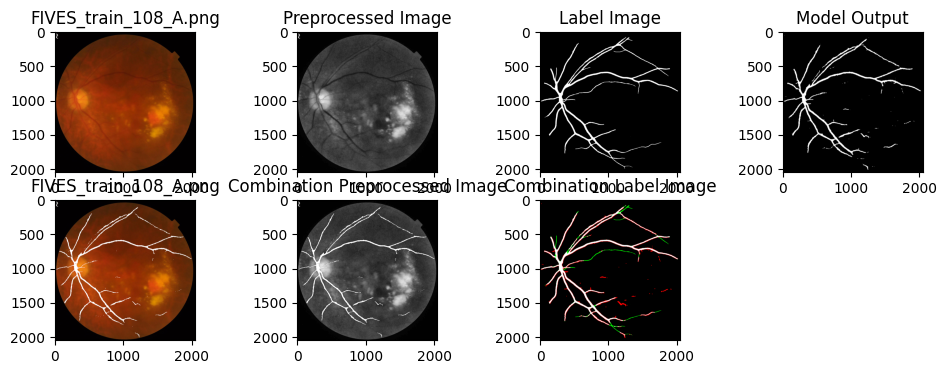

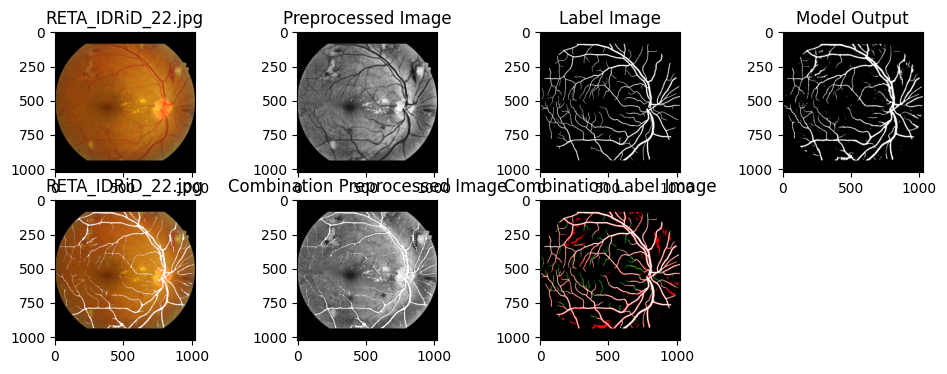

...

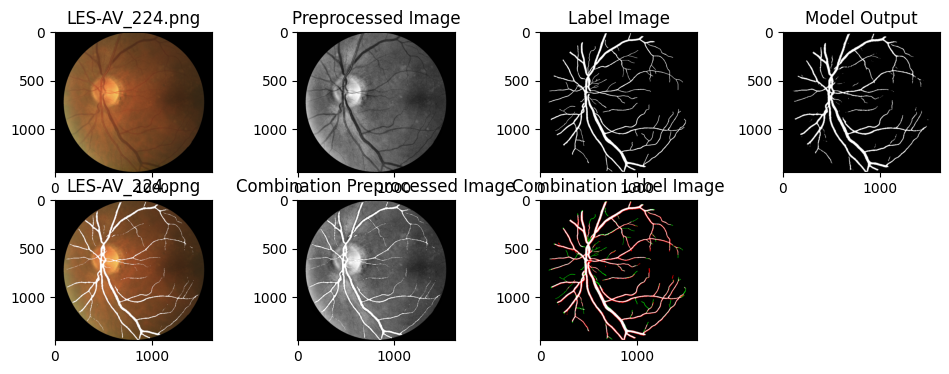

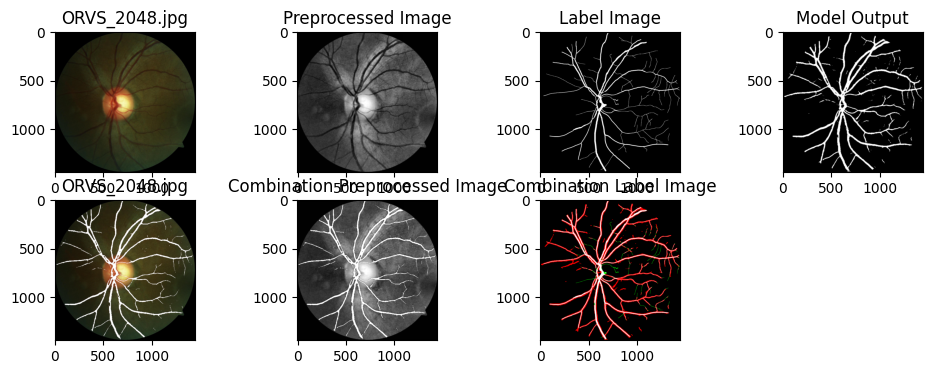

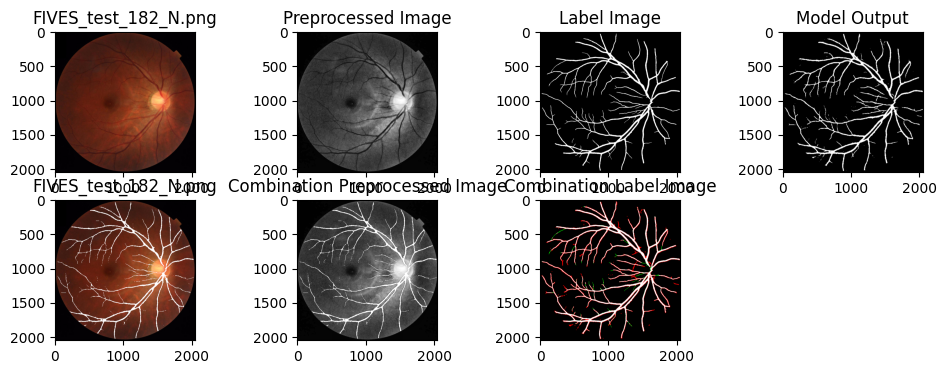

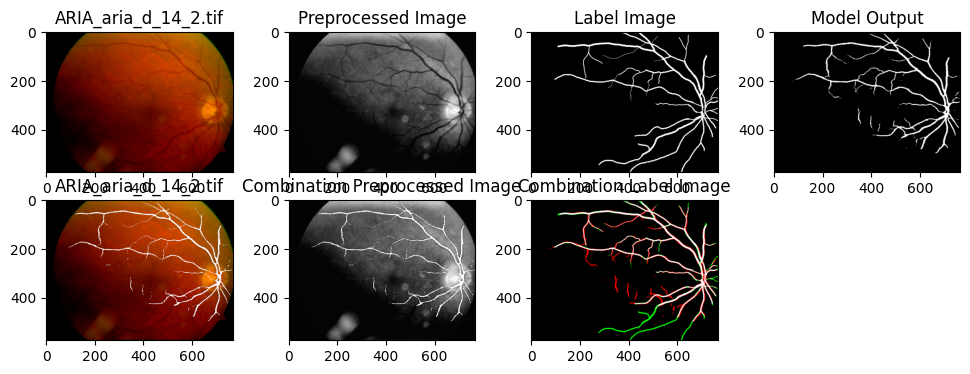

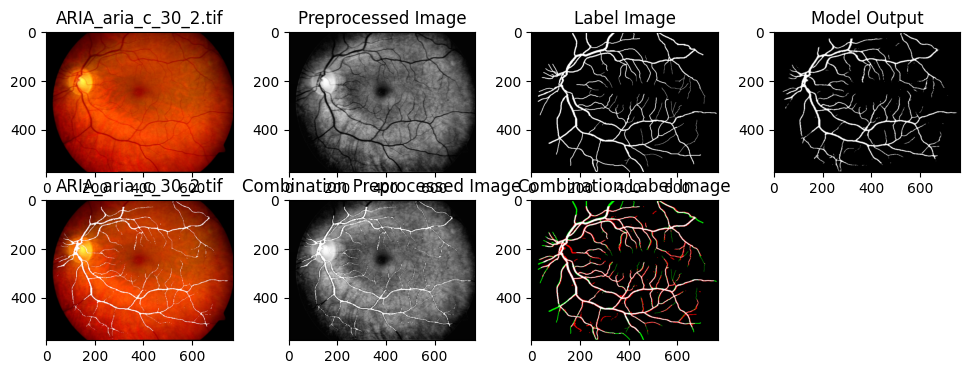

In [ ]:
# Plot model result
num_images_to_select = 50
RESIZE_SHAPE = (512, 512, 1)
check_result.visualize_FG_result(model, num_images_to_select, TEST_SOURCE, INPUT_SHAPE, test_preproc)